# Importing Libraries

In [1]:
!pip install umap-learn

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import umap
import plotly.graph_objs as go
import plotly.figure_factory as ff

     |████████████████████████████████| 88 kB 4.4 MB/s 
     |████████████████████████████████| 1.1 MB 15.9 MB/s 
  Created wheel for umap-learn: filename=umap_learn-0.5.3-py3-none-any.whl size=82829 sha256=9647a41ca8c27b15eba90e3f7638e27db91f1b4b5bf646eb1ad0a754477e6093
  Stored in directory: /root/.cache/pip/wheels/b3/52/a5/1fd9e3e76a7ab34f134c07469cd6f16e27ef3a37aeff1fe821
  Created wheel for pynndescent: filename=pynndescent-0.5.7-py3-none-any.whl size=54286 sha256=241bc920d92770f8f7e144229b73b3ec6b508600b14c9d8022f94894eb5e8419
  Stored in directory: /root/.cache/pip/wheels/7f/2a/f8/7bd5dcec71bd5c669f6f574db3113513696b98f3f9b51f496c
Successfully built umap-learn pynndescent


# Exploratory Data Analysis 

In [2]:
collisions = pd.read_csv("Collisions.csv")
print(collisions.head())
print(collisions.shape)
print(collisions.info())
print(collisions.describe())

   Number_of_Vehicles           Road_Type  Speed_limit Light_Conditions  \
0                   2    Dual carriageway           40         Daylight   
1                   2    Dual carriageway           40         Daylight   
2                   2  Single carriageway           30         Daylight   
3                   2  Single carriageway           30         Daylight   
4                   2  Single carriageway           30         Daylight   

   Weather_Conditions Road_Surface_Conditions Urban_or_Rural_Area  \
0  Fine no high winds                     Dry               Urban   
1  Fine no high winds                     Dry               Urban   
2  Fine no high winds                     Dry               Urban   
3  Fine no high winds                     Dry               Urban   
4  Fine no high winds                     Dry               Urban   

  Vehicle_Manoeuvre 1st_Point_of_Impact Sex_of_Driver  Age_of_Driver  \
0       Going ahead               Front          Male         

# Converting categorical features to numerical features

In [3]:
collisions['Urban_or_Rural_Area'] = collisions['Urban_or_Rural_Area'].map({'Urban': 1, 'Rural':0})
collisions['Sex_of_Driver'] = collisions['Sex_of_Driver'].map({'Male': 1, 'Female':0})
collisions['Damage'] = collisions['Damage'].map({'Light': 1, 'Severe':0})

# Plotting Correlation Heatmap

In [4]:
corrs = collisions.corr()
figure = ff.create_annotated_heatmap(
    z=corrs.values,
    x=list(corrs.columns),
    y=list(corrs.index),
    annotation_text=corrs.round(2).values,
    showscale=True)
figure.show()


# Creating dummy columns

In [5]:
# Creating dummy columns
categorical_features = ['Road_Type', 'Light_Conditions', 'Weather_Conditions', 'Road_Surface_Conditions', 'Vehicle_Manoeuvre','1st_Point_of_Impact']
newCollision= pd.get_dummies(collisions, columns = categorical_features)
print(newCollision.info())
print(newCollision.head(2))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 37869 entries, 0 to 37868
Data columns (total 42 columns):
 #   Column                                       Non-Null Count  Dtype
---  ------                                       --------------  -----
 0   Number_of_Vehicles                           37869 non-null  int64
 1   Speed_limit                                  37869 non-null  int64
 2   Urban_or_Rural_Area                          37869 non-null  int64
 3   Sex_of_Driver                                37869 non-null  int64
 4   Age_of_Driver                                37869 non-null  int64
 5   Engine_Capacity_(CC)                         37869 non-null  int64
 6   Damage                                       37869 non-null  int64
 7   Road_Type_Dual carriageway                   37869 non-null  uint8
 8   Road_Type_One way street                     37869 non-null  uint8
 9   Road_Type_Roundabout                         37869 non-null  uint8
 10  Road_Type_Single carri

# Dividing data into subsets

In [6]:
# Vehicle condition
subset1 = newCollision[['Number_of_Vehicles','Vehicle_Manoeuvre_Changing lane','Vehicle_Manoeuvre_Going ahead','Vehicle_Manoeuvre_Moving off','Vehicle_Manoeuvre_Overtaking','Vehicle_Manoeuvre_Parked','Vehicle_Manoeuvre_Reversing','Vehicle_Manoeuvre_Slowing or stopping','Vehicle_Manoeuvre_Turning','Vehicle_Manoeuvre_U turn','Vehicle_Manoeuvre_Waiting',
                      '1st_Point_of_Impact_Back','1st_Point_of_Impact_Front','1st_Point_of_Impact_Nearside','1st_Point_of_Impact_Offside','Engine_Capacity_(CC)']]



In [7]:
# External condition
subset2 = newCollision[['Road_Type_Dual carriageway','Road_Type_One way street','Road_Type_Roundabout','Road_Type_Slip road', 'Light_Conditions_Darkness lights lit','Light_Conditions_Darkness lights unlit','Light_Conditions_Darkness no lighting','Light_Conditions_Daylight', 
                      'Weather_Conditions_Fine and high winds','Weather_Conditions_Fine no high winds','Weather_Conditions_Fog or mist','Weather_Conditions_Raining and high winds','Weather_Conditions_Raining no high winds','Weather_Conditions_Snowing and high winds','Weather_Conditions_Snowing no high winds', 
                      'Road_Surface_Conditions_Dry','Road_Surface_Conditions_Flood over 3cm deep','Road_Surface_Conditions_Frost or ice','Road_Surface_Conditions_Snow','Road_Surface_Conditions_Wet or damp','Urban_or_Rural_Area' ]]


# Normalizing numerical features so that each feature has mean 0 and variance 1

In [8]:
feature_scaler = StandardScaler()
X1 = feature_scaler.fit_transform(subset1)
X2 = feature_scaler.fit_transform(subset2)

# Analysis on subset1 - Vehicle Condition

In [9]:
# Implementing UMAP to visualize dataset
u = umap.UMAP(n_neighbors=150, min_dist=0.4)
x1_umap = u.fit_transform(X1)

/usr/local/lib/python3.7/dist-packages/numba/np/ufunc/parallel.py:363: NumbaWarning:

The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 9107. The TBB threading layer is disabled.



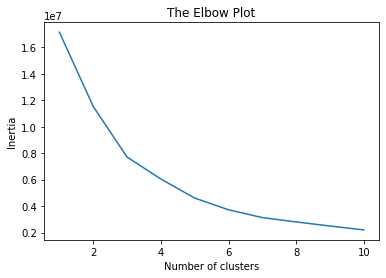

In [10]:
# Finding the number of clusters (K) - Elbow Plot Method
inertia = []
for i in range(1,11):
    kmeans = KMeans(n_clusters = i, random_state = 100)
    kmeans.fit(x1_umap)
    inertia.append(kmeans.inertia_)

plt.plot(range(1, 11), inertia)
plt.title('The Elbow Plot')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.show()

In [11]:
# Running KMeans to generate labels
kmeans = KMeans(n_clusters = 3)
kmeans.fit(x1_umap)

Number_of_Vehicles = list(collisions['Number_of_Vehicles'])
Vehicle_Manoeuvre = list(collisions['Vehicle_Manoeuvre'])
Point_of_Impact = list(collisions['1st_Point_of_Impact'])
Engine_Capacity = list(collisions['Engine_Capacity_(CC)'])



data = [go.Scatter(x=x1_umap[:,0], y=x1_umap[:,1], mode='markers',
                    marker = dict(color=kmeans.labels_, colorscale='Rainbow', opacity=0.5),
                                text=[f'Number_of_Vehicles: {a}; Vehicle_Manoeuvre: {b}; 1st_Point_of_Impact:{c}, Engine_Capacity_(CC):{d}' for a,b,c,d in list(zip(Number_of_Vehicles,Vehicle_Manoeuvre,Point_of_Impact,Engine_Capacity))],
                                hoverinfo='text')]

layout = go.Layout(title = 'UMAP Dimensionality Reduction', width = 1000, height = 700,
                    xaxis = dict(title='First Dimension'),
                    yaxis = dict(title='Second Dimension'))
fig = go.Figure(data=data, layout=layout)
fig.show()


# Analysis on subset2 - External Condititon 

In [12]:
# Implementing UMAP to visualize dataset
u = umap.UMAP(n_neighbors=150, min_dist=0.4)
x2_umap = u.fit_transform(X2)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:261: UserWarning:

Graph is not fully connected, spectral embedding may not work as expected.



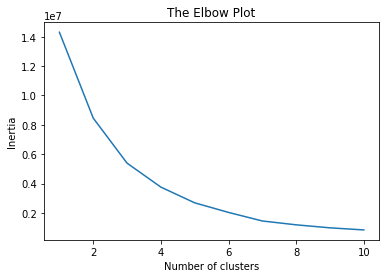

In [13]:
#Finding the number of clusters (K) - Elbow Plot Method
inertia = []
for i in range(1,11):
    kmeans = KMeans(n_clusters = i, random_state = 100)
    kmeans.fit(x2_umap)
    inertia.append(kmeans.inertia_)

plt.plot(range(1, 11), inertia)
plt.title('The Elbow Plot')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.show()

In [15]:
#Running KMeans to generate labels
kmeans = KMeans(n_clusters = 4)
kmeans.fit(x2_umap)

Road_Type = list(collisions['Road_Type'])
Light_Conditions = list(collisions['Light_Conditions'])
Weather_Conditions = list(collisions['Weather_Conditions'])
Road_Surface_Conditions = list(collisions['Road_Surface_Conditions'])
Urban_or_Rural_Area = list(collisions['Urban_or_Rural_Area'])


data = [go.Scatter(x=x2_umap[:,0], y=x2_umap[:,1], mode='markers',
                    marker = dict(color=kmeans.labels_, colorscale='Rainbow', opacity=0.5),
                                text=[f'Road_Type: {a}; Light_Conditions: {b}; Weather_Conditions:{c}, Road_Surface_Conditions:{d}, Urban_or_Rural_Area:{e}' for a,b,c,d,e in list(zip(Road_Type,Light_Conditions,Weather_Conditions,Road_Surface_Conditions,Urban_or_Rural_Area))],
                                hoverinfo='text')]

layout = go.Layout(title = 'UMAP Dimensionality Reduction', width = 1000, height = 700,
                    xaxis = dict(title='First Dimension'),
                    yaxis = dict(title='Second Dimension'))
fig = go.Figure(data=data, layout=layout)
fig.show()